In [1]:
from gluonts.dataset.repository import get_dataset
%cd ../
import matplotlib.pyplot as plt

import os
import pickle

/data/r.ramjattan/CL_for_timeseries


In [2]:
NORMALIZER_NAME = "gas_t_student"
MEAN_MODEL = "gas"
DL_MODEL_LIBRARY = "gluonts"
DATASET_NAME = "fred_md"
DATASET_TYPE = "gluonts"    # gluonts or synthetic
DL_MODEL = "deepar"
mean_str = 0.001
var_str = 0.001

multivariate = "_multivariate"   # "_multivariate" if its multivariate, empty otherwise
multivariate = ""

ROOT_FOLDER = f"RESULTS_{DATASET_NAME}_{DL_MODEL}_{NORMALIZER_NAME}_{MEAN_MODEL}_{DL_MODEL_LIBRARY}_{mean_str}_{var_str}" + multivariate
ROOT_FOLDER

'RESULTS_fred_md_deepar_gas_t_student_gas_gluonts_0.001_0.001'

Get results

In [3]:
normalizer_folder = os.path.join(ROOT_FOLDER, "normalizer")
init_params_norm_filename = os.path.join(normalizer_folder, 'init_params.json')
###
means_folder = os.path.join(normalizer_folder, 'means')
train_means_folder = os.path.join(means_folder, 'train')
test_means_folder = os.path.join(means_folder, 'test')
vars_folder = os.path.join(normalizer_folder, 'vars')
train_vars_folder = os.path.join(vars_folder, 'train')
test_vars_folder = os.path.join(vars_folder, 'test')
norm_ts_folder = os.path.join(normalizer_folder, 'normalized_ts')
train_norm_ts_folder = os.path.join(norm_ts_folder, 'train')
test_norm_ts_folder = os.path.join(norm_ts_folder, 'test')
params_folder = os.path.join(normalizer_folder, 'normalizer_params')
train_params_folder = os.path.join(params_folder, 'train')
test_params_folder = os.path.join(params_folder, 'test')

train_means = []
for i in range(len(os.listdir(train_means_folder))):
    with open(os.path.join(train_means_folder, f'ts_{i}.pkl'), 'rb') as f:
        train_means.append(pickle.load(f))
test_means = []
for i in range(len(os.listdir(test_means_folder))):
    with open(os.path.join(test_means_folder, f'ts_{i}.pkl'), 'rb') as f:
        test_means.append(pickle.load(f))
train_vars = []
for i in range(len(os.listdir(train_vars_folder))):
    with open(os.path.join(train_vars_folder, f'ts_{i}.pkl'), 'rb') as f:
        train_vars.append(pickle.load(f))
test_vars = []
for i in range(len(os.listdir(test_vars_folder))):
    with open(os.path.join(test_vars_folder, f'ts_{i}.pkl'), 'rb') as f:
        test_vars.append(pickle.load(f))
train_params = []
for i in range(len(os.listdir(train_params_folder))):
    with open(os.path.join(train_params_folder, f'ts_{i}.pkl'), 'rb') as f:
        train_params.append(pickle.load(f))
test_params = []
for i in range(len(os.listdir(test_params_folder))):
    with open(os.path.join(test_params_folder, f'ts_{i}.pkl'), 'rb') as f:
        test_params.append(pickle.load(f))
test_norm_ts = []
for i in range(len(os.listdir(test_norm_ts_folder))):
    with open(os.path.join(test_norm_ts_folder, f'ts_{i}.pkl'), 'rb') as f:
        test_norm_ts.append(pickle.load(f))

Get dataset

In [4]:
from data_manager import GluonTSDataManager

bool_multivar = False if multivariate == "" else True
data_manager = GluonTSDataManager(DATASET_NAME, bool_multivar)

prediction_length = data_manager.prediction_length
context_length = data_manager.context_length

data_manager.set_data_from_normalizer(train_means, train_vars, test_means, test_vars, train_params)
train_dataset, test_dataset = data_manager.get_gluon_dataset_for_dl_layer()

Plot stuff

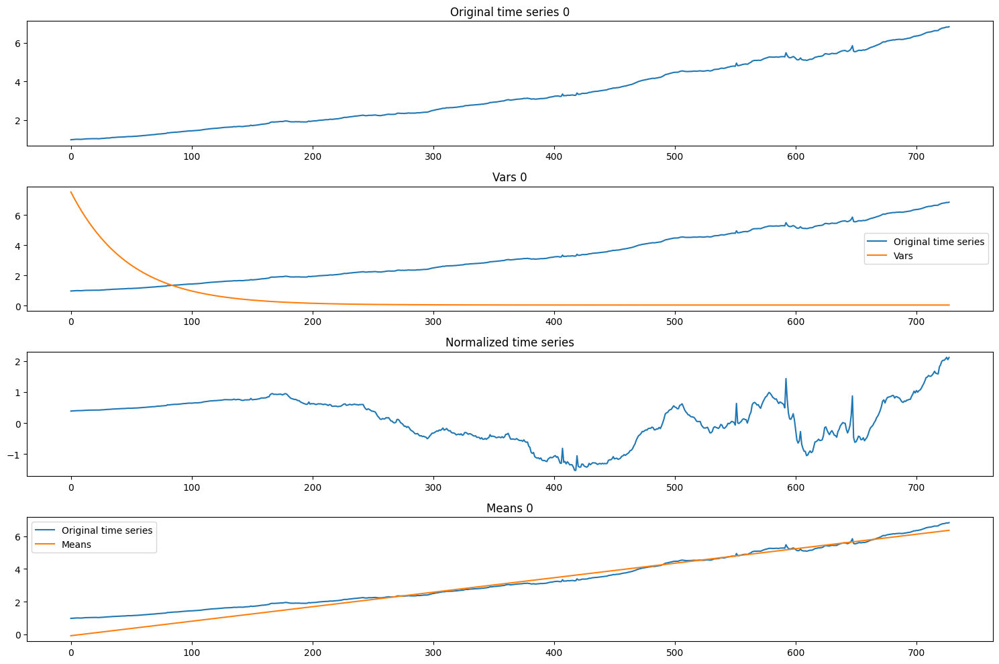

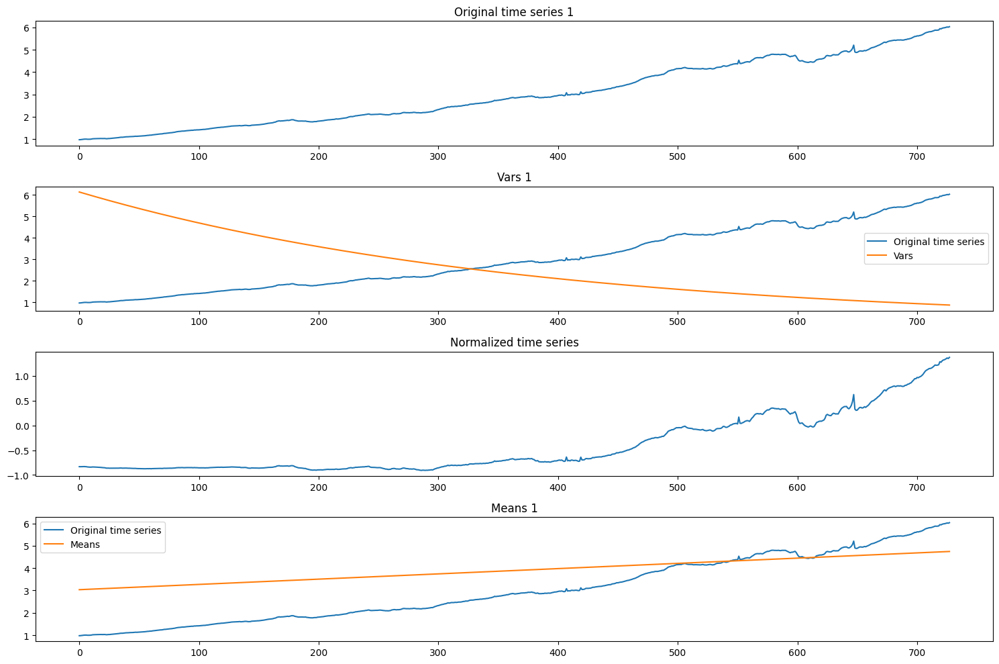

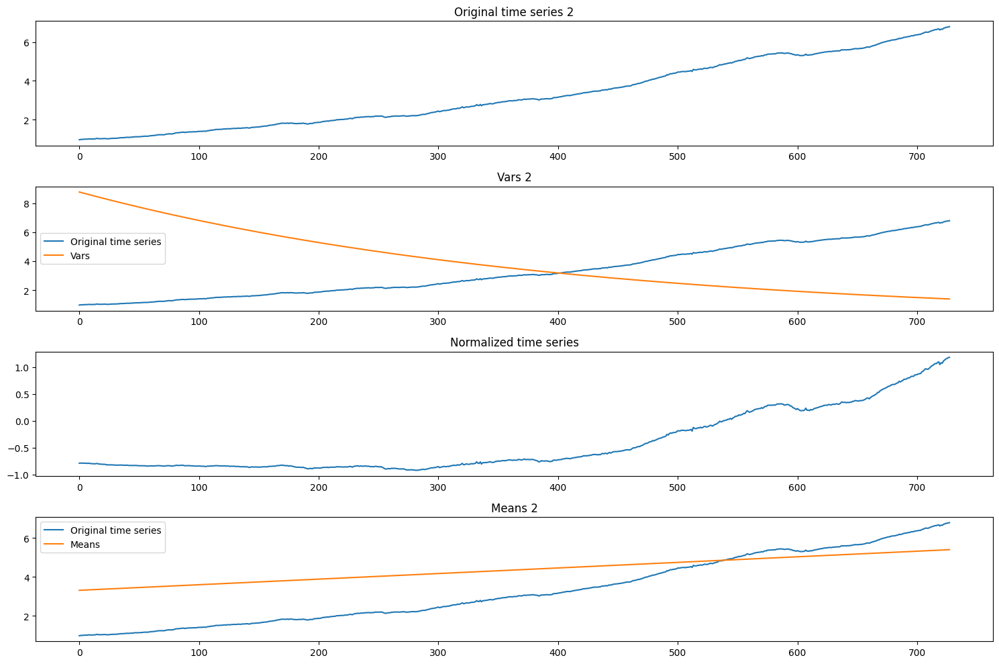

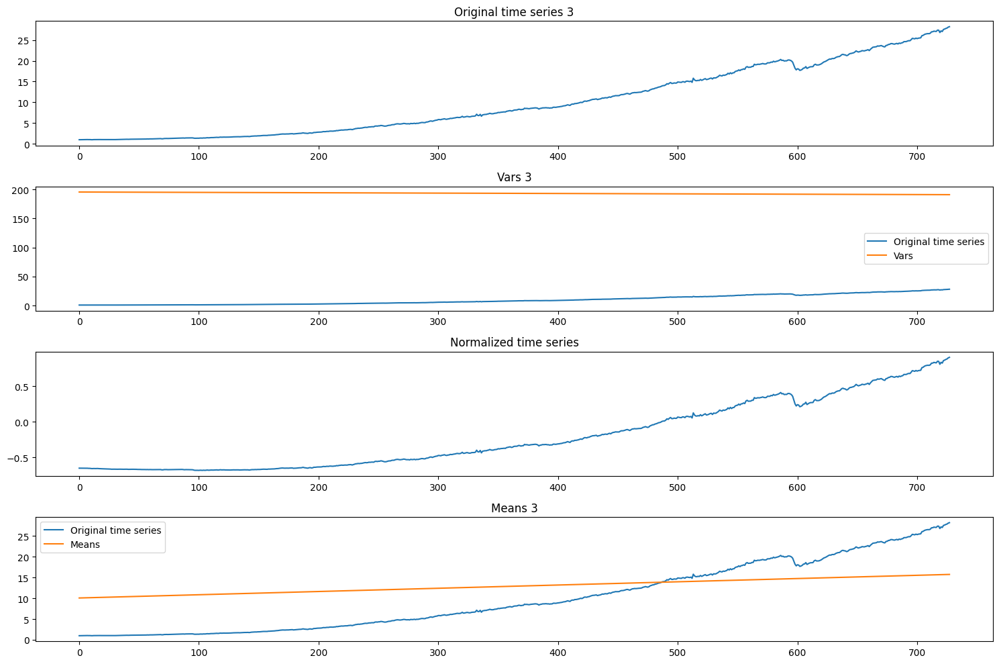

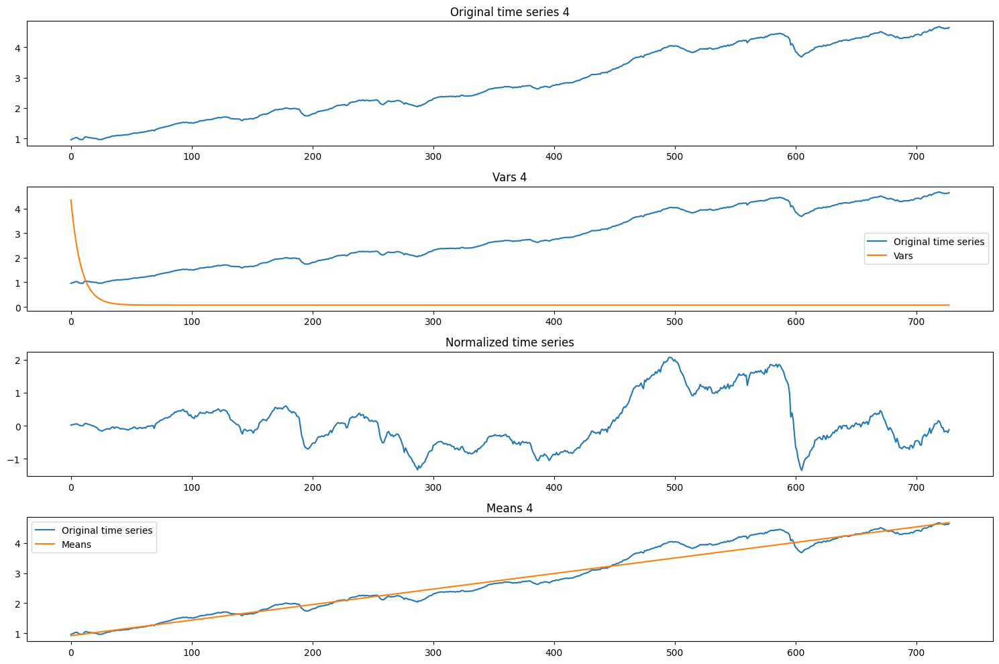

...

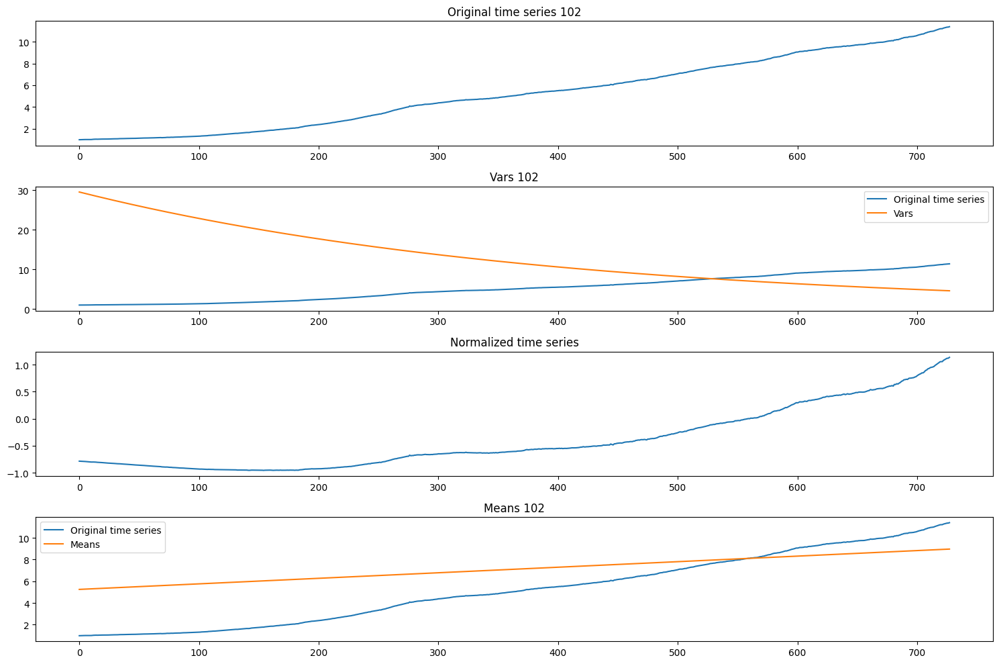

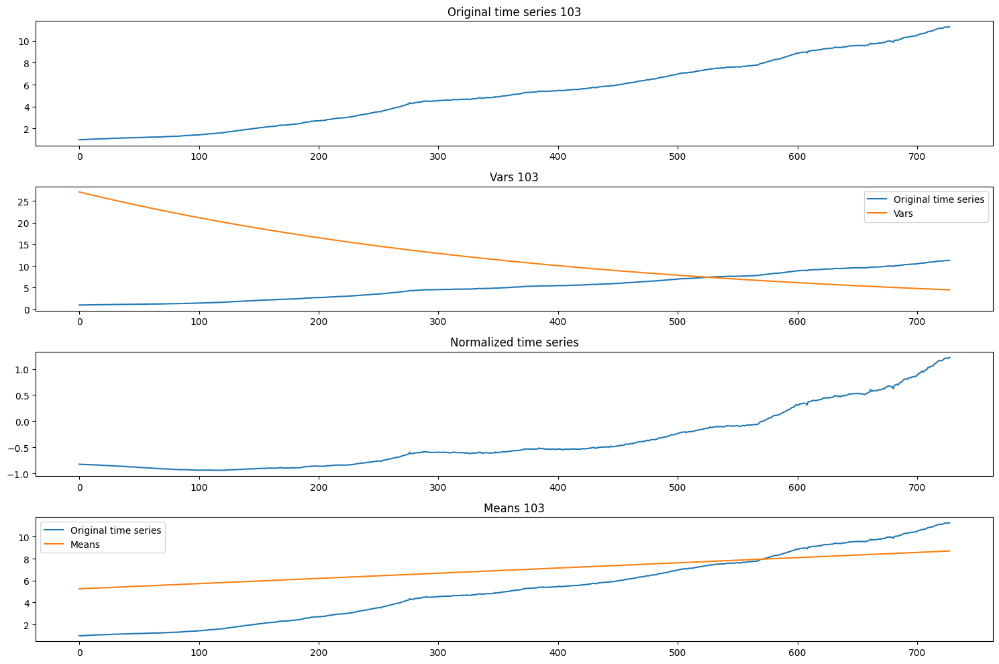

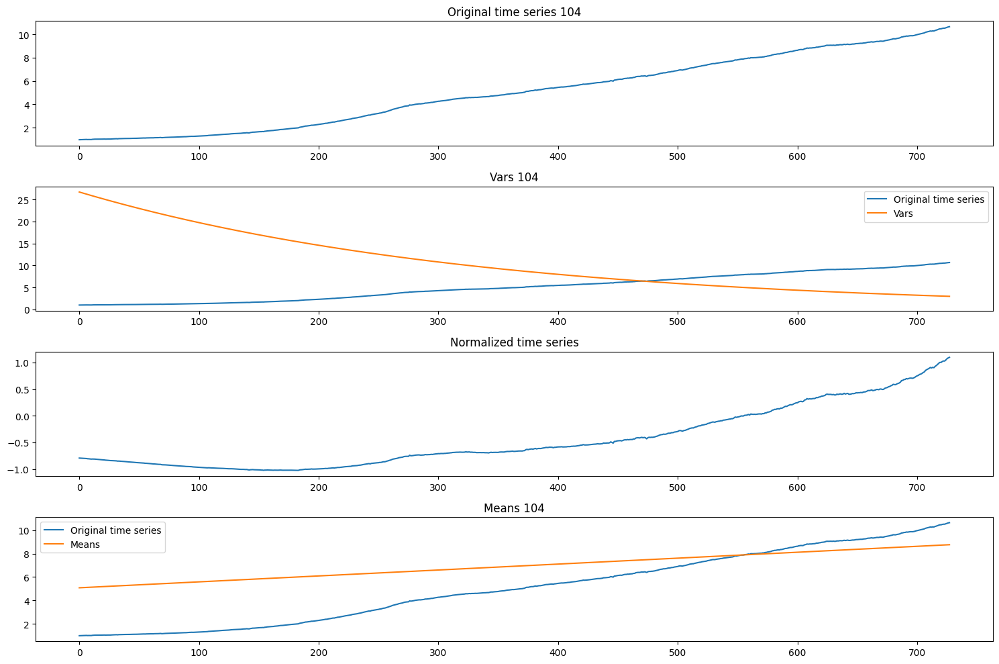

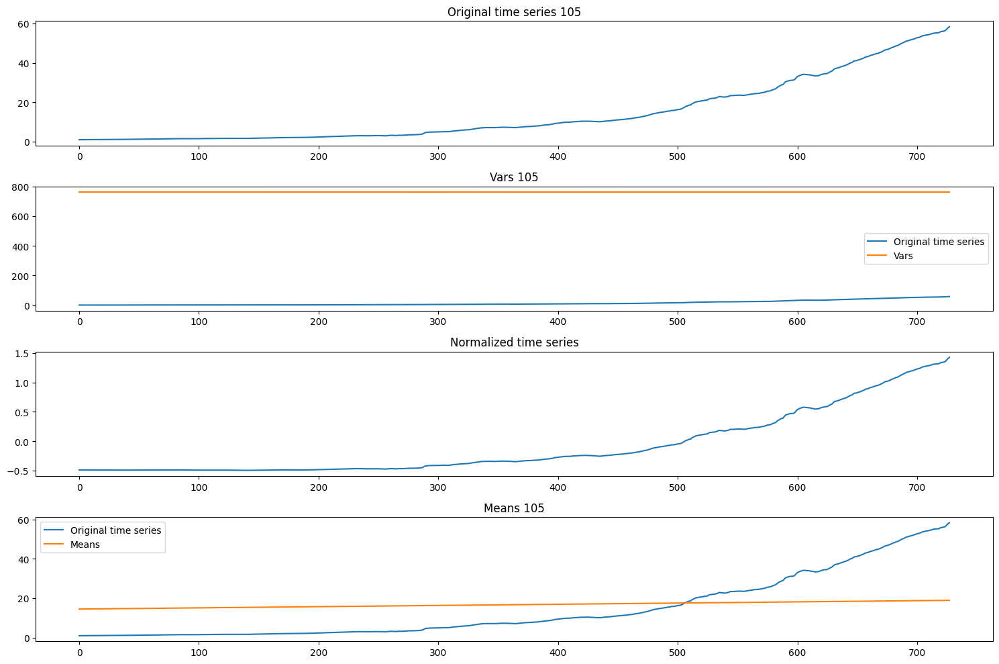

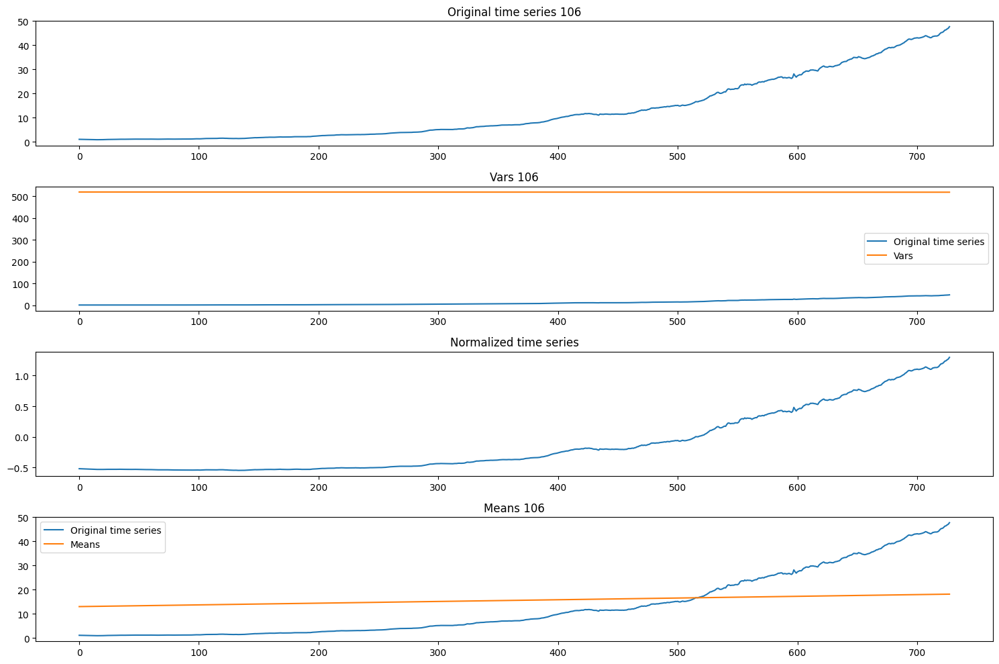

In [6]:
# for ts_index in range(min(50, len(test_dataset))):
for ts_index in range(len(test_dataset)):

    # create a subfigure with 5 plots in each: 
    # - the original time series, 
    # - the normalized time series, 
    # - the original time series with its means,
    # - the original time series with its vars,
    # - the original time series with the predictions
    ts = test_dataset[ts_index]["target"]
    means = test_means[ts_index]
    vars = test_vars[ts_index]
    norm_ts = test_norm_ts[ts_index]

    fig, axs = plt.subplots(4, 1, figsize=(15, 10))
    axs[0].plot(ts)
    axs[0].set_title(f'Original time series {ts_index}')

    axs[1].plot(ts)
    axs[1].plot(vars)
    axs[1].set_title(f'Vars {ts_index}')
    axs[1].legend(['Original time series', 'Vars'])

    axs[2].plot(norm_ts)
    axs[2].set_title('Normalized time series')

    axs[3].plot(ts)
    axs[3].plot(means)
    axs[3].set_title(f'Means {ts_index}')
    axs[3].legend(['Original time series', 'Means'])

    plt.tight_layout()
    plt.show()